# Exploratory Data Analysis

In [1]:
'''
import pandas as pd
import zipfile

zip_file_path = '../data/processed_data.zip'
csv_file_name = 'processed_data_009_D.csv'

with zipfile.ZipFile(zip_file_path, 'r') as zip_file:
    with zip_file.open(csv_file_name) as csv_file:
        df = pd.read_csv(csv_file)

df
'''

"\nimport pandas as pd\nimport zipfile\n\nzip_file_path = '../data/processed_data.zip'\ncsv_file_name = 'processed_data_009_D.csv'\n\nwith zipfile.ZipFile(zip_file_path, 'r') as zip_file:\n    with zip_file.open(csv_file_name) as csv_file:\n        df = pd.read_csv(csv_file)\n\ndf\n"

In [2]:
'''
import pandas as pd
import zipfile
import re


zip_file_path = '../data/processed_data_date.zip'

df_A = pd.DataFrame()
df_D = pd.DataFrame()


with zipfile.ZipFile(zip_file_path, 'r') as zip_file:
    for file_name in zip_file.namelist():
        if file_name.endswith('.csv'):
            with zip_file.open(file_name) as csv_file:
                temp_df = pd.read_csv(csv_file)
                date = re.findall(r'\d+', file_name)
                temp_df['Date'] = float(date[0])
                
                # Verificamos si el fichero acaba en A.csv o D.csv
                if file_name.endswith('A.csv'):
                    df_A = pd.concat([df_A, temp_df], ignore_index=True)
                    
                    # Verificamos si hemos alcanzado o superado el límite de filas
                    if len(df_A) >= 50000000:
                        print(f"Se ha alcanzado el límite de {limite_filas_A} filas en df_A. Deteniendo.")
                        break
                
                elif file_name.endswith('D.csv'):
                    df_D = pd.concat([df_D, temp_df], ignore_index=True)
                    #print(f'{file_name} añadido a df_D')
                    #print(f'Tamaño actual de df_D: {len(df_D)} filas')
                
                # Liberamos la memoria
                del temp_df

print(f"DataFrame con ficheros A.csv tiene {len(df_A)} filas.")
print(f"DataFrame con ficheros D.csv tiene {len(df_D)} filas.")
'''

'\nimport pandas as pd\nimport zipfile\nimport re\n\n\nzip_file_path = \'../data/processed_data_date.zip\'\n\ndf_A = pd.DataFrame()\ndf_D = pd.DataFrame()\n\n\nwith zipfile.ZipFile(zip_file_path, \'r\') as zip_file:\n    for file_name in zip_file.namelist():\n        if file_name.endswith(\'.csv\'):\n            with zip_file.open(file_name) as csv_file:\n                temp_df = pd.read_csv(csv_file)\n                date = re.findall(r\'\\d+\', file_name)\n                temp_df[\'Date\'] = float(date[0])\n                \n                # Verificamos si el fichero acaba en A.csv o D.csv\n                if file_name.endswith(\'A.csv\'):\n                    df_A = pd.concat([df_A, temp_df], ignore_index=True)\n                    \n                    # Verificamos si hemos alcanzado o superado el límite de filas\n                    if len(df_A) >= 50000000:\n                        print(f"Se ha alcanzado el límite de {limite_filas_A} filas en df_A. Deteniendo.")\n            

Estos códigos de los he utilizado para separar los conjuntos de datos finales entre los Ascendentes y los Descendentes. 

In [3]:
import pandas as pd

df_A = pd.read_csv('../data/final_dataset_A_date.csv', sep=',')
df_D = pd.read_csv('../data/final_dataset_D_date.csv', sep=',')

In [4]:
df_A.describe()

,fwns,fw,air_temperature,PWV,VOD,vsm,VPD,lat_var,lon_var,Brightness_Temperature__H_ku,Brightness_Temperature__V_ku,Time_Information,Brightness_Temperature__H_ka,Brightness_Temperature__V_ka,Date
count,2.217369e+07,2.217369e+07,2.217369e+07,2.217369e+07,2.217369e+07,2.217369e+07,2.217369e+07,2.217369e+07,2.217369e+07,2.217369e+07,2.217369e+07,2.217369e+07,2.217369e+07,2.217369e+07,2.217369e+07
mean,3.926060e-02,4.473112e-02,2.945818e+02,1.841158e+01,1.205356e+00,1.790866e-01,1.483443e+00,2.708313e+01,1.637983e+01,2.688504e+02,2.804805e+02,6.160516e+02,2.724043e+02,2.806972e+02,1.921122e+02
std,4.973632e-02,5.366056e-02,9.286252e+00,1.171065e+01,5.115000e-01,8.353919e-02,1.162657e+00,2.974574e+01,8.144632e+01,1.525217e+01,1.100874e+01,4.927019e+02,1.286479e+01,1.030926e+01,9.213417e+01
min,5.306048e-20,2.488907e-09,2.631247e+02,8.402887e-07,-0.000000e+00,2.500000e-02,0.000000e+00,-5.483817e+01,-1.798703e+02,1.111600e+02,1.931000e+02,-1.391000e+03,1.307600e+02,2.134300e+02,1.000000e+00
25%,1.027741e-02,1.246036e-02,2.872189e+02,9.960558e+00,8.486507e-01,1.207197e-01,5.551193e-01,5.796451e+00,-6.419306e+01,2.600600e+02,2.727100e+02,3.970000e+02,2.646600e+02,2.732700e+02,1.230000e+02
50%,2.295265e-02,2.663237e-02,2.953891e+02,1.565595e+01,1.222102e+00,1.830398e-01,1.274193e+00,3.304897e+01,2.995679e+01,2.713200e+02,2.819700e+02,6.500000e+02,2.743700e+02,2.817300e+02,1.960000e+02
75%,4.770730e-02,5.526239e-02,3.021650e+02,2.421403e+01,1.586317e+00,2.403098e-01,2.106069e+00,5.127790e+01,8.286746e+01,2.807800e+02,2.883200e+02,1.045000e+03,2.823000e+02,2.877600e+02,2.650000e+02
max,8.353922e-01,9.243032e-01,3.354778e+02,8.000000e+01,2.995732e+00,6.000000e-01,9.348501e+00,8.069721e+01,1.798704e+02,3.047000e+02,3.182300e+02,1.435000e+03,3.070700e+02,3.185400e+02,3.640000e+02


In [5]:
df_D.describe()

,fwns,fw,air_temperature,PWV,VOD,vsm,VPD,lat_var,lon_var,Brightness_Temperature__H_ku,Brightness_Temperature__V_ku,Time_Information,Brightness_Temperature__H_ka,Brightness_Temperature__V_ka,Date
count,1.992378e+07,1.992378e+07,1.992378e+07,1.992378e+07,1.992378e+07,1.992378e+07,1.992378e+07,1.992378e+07,1.992378e+07,1.992378e+07,1.992378e+07,1.992378e+07,1.992378e+07,1.992378e+07,1.992378e+07
mean,3.494591e-02,4.018508e-02,2.857628e+02,2.373961e+01,1.350946e+00,1.944845e-01,4.775026e-01,2.286528e+01,1.298785e+01,2.645374e+02,2.742694e+02,6.477007e+02,2.673874e+02,2.741388e+02,1.907115e+02
std,4.777585e-02,5.108808e-02,7.943120e+00,1.293264e+01,5.798669e-01,7.743002e-02,4.856104e-01,2.952052e+01,8.008951e+01,1.472613e+01,9.229964e+00,6.508918e+02,1.244289e+01,8.339447e+00,9.084863e+01
min,1.169603e-20,6.135559e-11,2.610598e+02,2.638213e-05,-0.000000e+00,2.500000e-02,0.000000e+00,-5.483817e+01,-1.798703e+02,1.113200e+02,1.909300e+02,-1.390000e+03,1.308200e+02,2.108300e+02,1.000000e+00
25%,7.445866e-03,9.955998e-03,2.792785e+02,1.427804e+01,9.435404e-01,1.496168e-01,3.914563e-02,-1.667621e+00,-6.341497e+01,2.566900e+02,2.681700e+02,2.930000e+02,2.605800e+02,2.683700e+02,1.260000e+02
50%,1.900589e-02,2.308466e-02,2.870526e+02,2.100317e+01,1.322307e+00,1.990055e-01,3.504703e-01,2.717044e+01,2.658504e+01,2.680600e+02,2.761800e+02,5.610000e+02,2.702600e+02,2.756300e+02,1.950000e+02
75%,4.203807e-02,4.934137e-02,2.926225e+02,3.064584e+01,1.746292e+00,2.449638e-01,7.618477e-01,4.826388e+01,7.975507e+01,2.757700e+02,2.813500e+02,1.225000e+03,2.769400e+02,2.806500e+02,2.590000e+02
max,8.385025e-01,1.015137e+00,3.062443e+02,8.000000e+01,2.995732e+00,6.000000e-01,3.676859e+00,8.069721e+01,1.798704e+02,2.921900e+02,3.059700e+02,1.439000e+03,2.922200e+02,3.039700e+02,3.650000e+02


### Datos faltantes (nan)

In [6]:
print('Valores faltantes dataset A')
print(df_A.isnull().sum())  
print('------------------------------------')
print('Valores faltantes dataset D')
print(df_D.isnull().sum()) 

Valores faltantes dataset A
fwns                            0
fw                              0
air_temperature                 0
PWV                             0
VOD                             0
vsm                             0
VPD                             0
lat_var                         0
lon_var                         0
Brightness_Temperature__H_ku    0
Brightness_Temperature__V_ku    0
Time_Information                0
Brightness_Temperature__H_ka    0
Brightness_Temperature__V_ka    0
Date                            0
dtype: int64
------------------------------------
Valores faltantes dataset D
fwns                            0
fw                              0
air_temperature                 0
PWV                             0
VOD                             0
vsm                             0
VPD                             0
lat_var                         0
lon_var                         0
Brightness_Temperature__H_ku    0
Brightness_Temperature__V_ku    0
Time_Infor

### Distribución de las variables

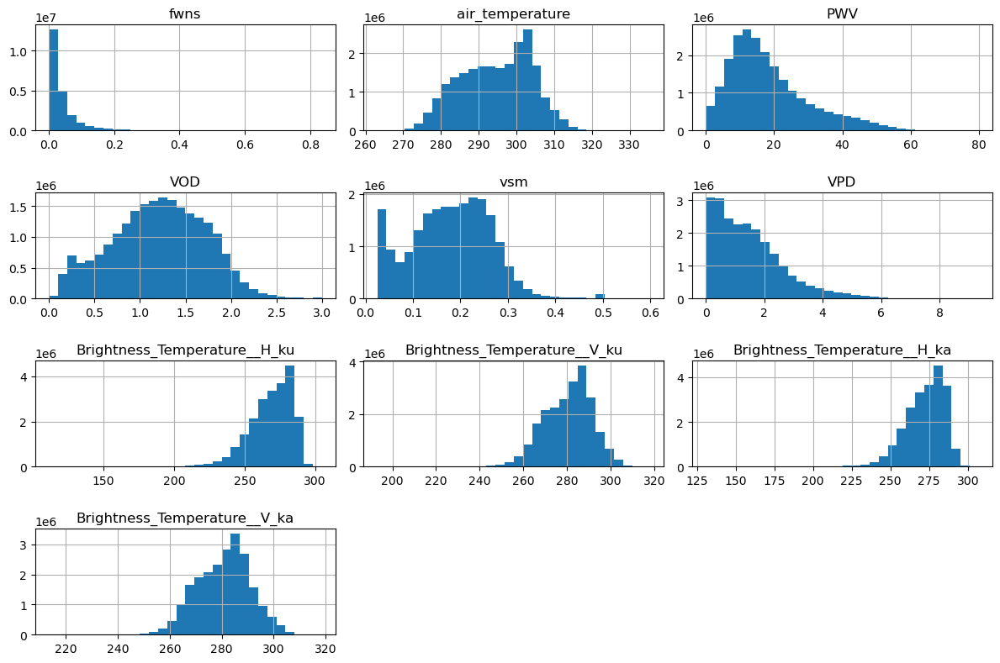

In [7]:
import matplotlib.pyplot as plt

df_distribution_A = df_A.drop(columns=['fw', 'lat_var', 'lon_var', 'Time_Information', 'Date'])
df_distribution_A.hist(bins=30, figsize=(12, 8))
plt.tight_layout()
plt.show()

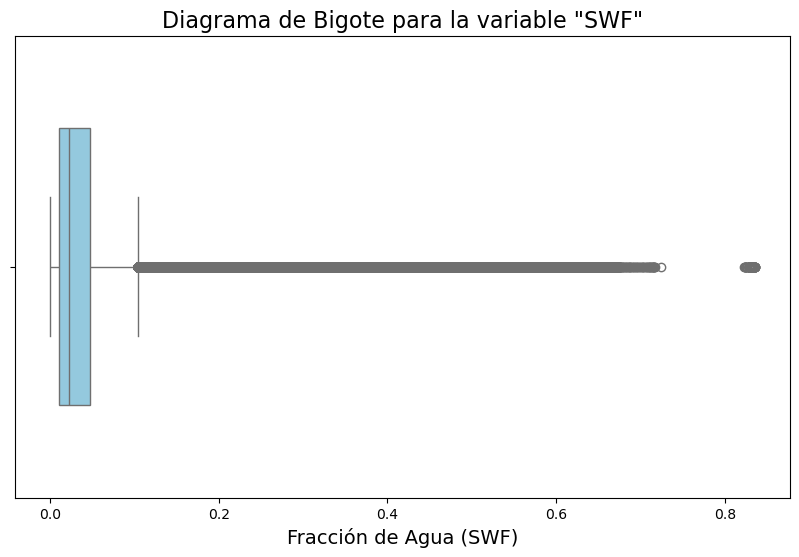

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.boxplot(x=df_A['fwns'], color='skyblue', width=0.6)

plt.title('Diagrama de Bigote para la variable "SWF"', fontsize=16)
plt.xlabel('Fracción de Agua (SWF)', fontsize=14)

plt.show()

Como podemos ver en ambos datasets, la variable fwns (fracción de agua no suavizada) es muy baja. 


El valor mínimo de fracción de agua es 0 (o muy cercano a cero), lo que indica que hay algunos valores en los que la fracción de agua es casi nula o inexistente, lo que viene a decir que en esas coordenadas hay tierra.


El primer cuartil (25%) de 0.0074 sugiere que el 25% de las observaciones tienen una fracción de agua menor que este valor. 

La mediana (50%) de 0.0190 muestra que el 50% de los datos son menores a este valor, lo que indica que la fracción de agua tiende a estar en valores bajos en la mayoría de los datos.

El tercer cuartil (75%) de 0.0420 indica que el 75% de las observaciones tienen valores de fwns menores que 0.042, lo que sugiere que la mayoría de los datos están concentrados en un rango bajo de fracción de agua.

Como podemos observar en detalle en el boxplot, los datos de fwns son muy bajos. La mediana está sesgada a la derecha (mayoría de los datos están concentrados en los valores bajos, pero hay algunos valores altos) y la caja o box, que representa el rango intercuartílico (IQR), es muy estrecha, una caja pequeña indica que los datos están concentrados alrededor de la mediana. Los bigotes cortos sugieren que los datos están más concentrados alrededor de la mediana. El bigote derecho, está entono al 0.1, y más allá de ese bigote, los puntos se traducirían como "atipicos". Son junto estos datos atipicos los que nos interesan para el estudio porque es donde debería haber humedades. 


El valor máximo (max) de 0.8385.

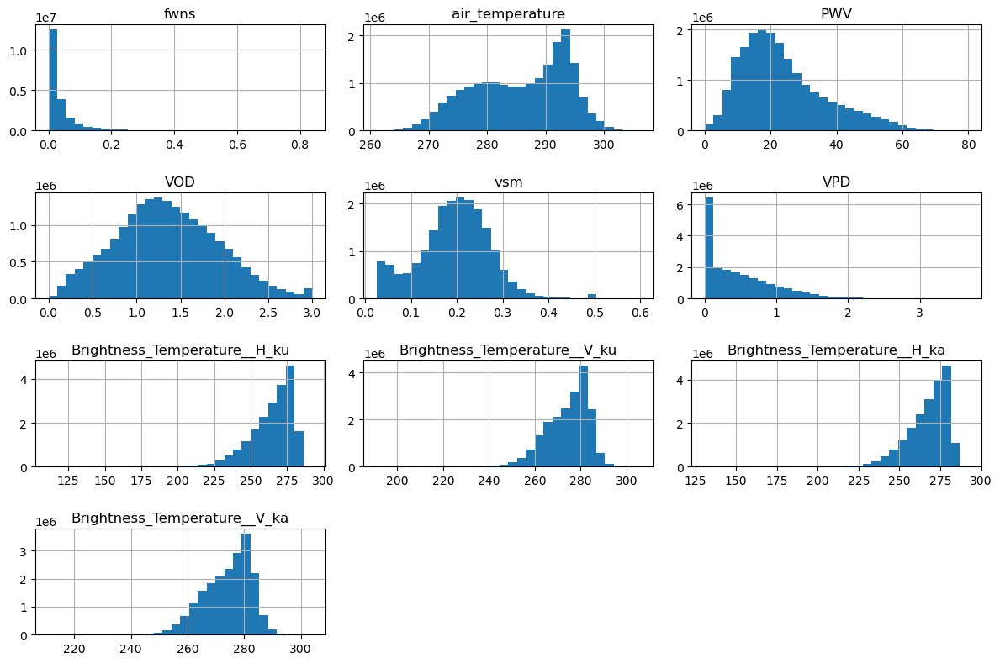

In [9]:
import matplotlib.pyplot as plt

df_distribution_D = df_D.drop(columns=['fw', 'lat_var', 'lon_var', 'Time_Information', 'Date'])
df_distribution_D.hist(bins=30, figsize=(12, 8))
plt.tight_layout()
plt.show()

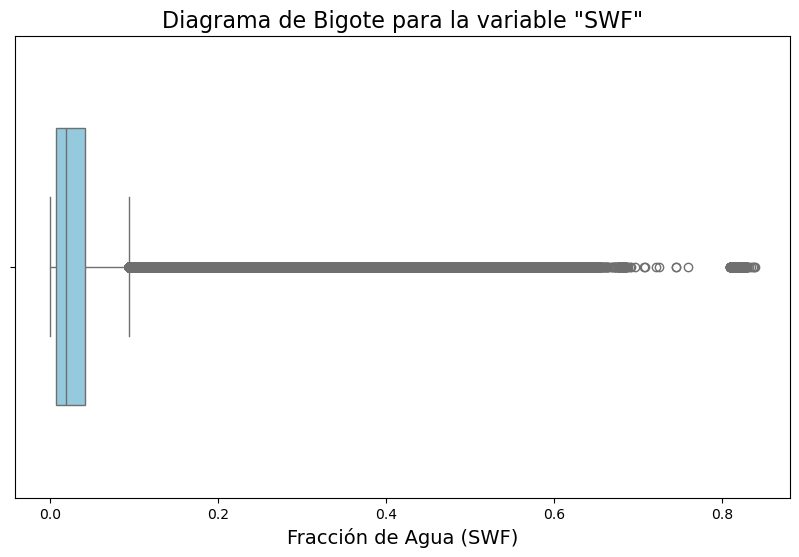

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.boxplot(x=df_D['fwns'], color='skyblue', width=0.6)

plt.title('Diagrama de Bigote para la variable "SWF"', fontsize=16)
plt.xlabel('Fracción de Agua (SWF)', fontsize=14)

plt.show()

Vemos que los resultados para el dataset Descendente son similiares a los Ascendentes

### Distribución de SWF por rangos.


Distribución por rangos:
rango_fwns
0-0.002        1727084
0.002-0.008    2728580
0.008-0.015    3346391
0.015-0.02     2174059
0.02-0.025     1804774
0.025-0.04     3646320
0.04-0.08      3937165
0.08-0.3       2707997
0.3-1.0         101316
Name: count, dtype: int64


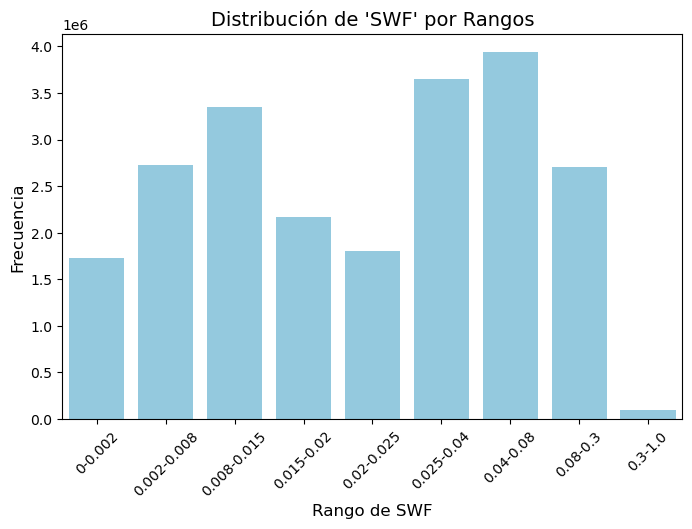

In [27]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Distribución por rangos
bins = [0, 0.002, 0.008, 0.015, 0.02, 0.025, 0.04, 0.08, 0.3, 1.0]  # Definimos los rangos
labels = ["0-0.002","0.002-0.008", "0.008-0.015", "0.015-0.02", "0.02-0.025", "0.025-0.04", "0.04-0.08","0.08-0.3", "0.3-1.0"]
df_A['rango_fwns'] = pd.cut(df_A['fwns'], bins=bins, labels=labels, include_lowest=True)

distribucion = df_A['rango_fwns'].value_counts().sort_index()
df_A = df_A.drop(columns=['rango_fwns'])


print("\nDistribución por rangos:")
print(distribucion)

plt.figure(figsize=(8, 5))
sns.barplot(x=distribucion.index, y=distribucion.values, color='skyblue')

plt.title("Distribución de 'SWF' por Rangos", fontsize=14)
plt.xlabel("Rango de SWF", fontsize=12)
plt.ylabel("Frecuencia", fontsize=12)
plt.xticks(rotation=45)

plt.show()


### Mapas Geoespaciales

In [12]:
import pandas as pd

def promedio_por_dia(df, var):
    """
    Calcula el promedio de las variables 'VDO' y 'SWF' para cada día del año.
    
    Parámetros:
    df (pd.DataFrame): DataFrame con las columnas 'Date', 'VDO' y 'SWF'.
    
    Retorna:
    pd.DataFrame: DataFrame con el promedio de 'VDO' y 'SWF' para cada día.
    """
    return df.groupby(['lon_var', 'lat_var'], as_index=False)[var].mean()

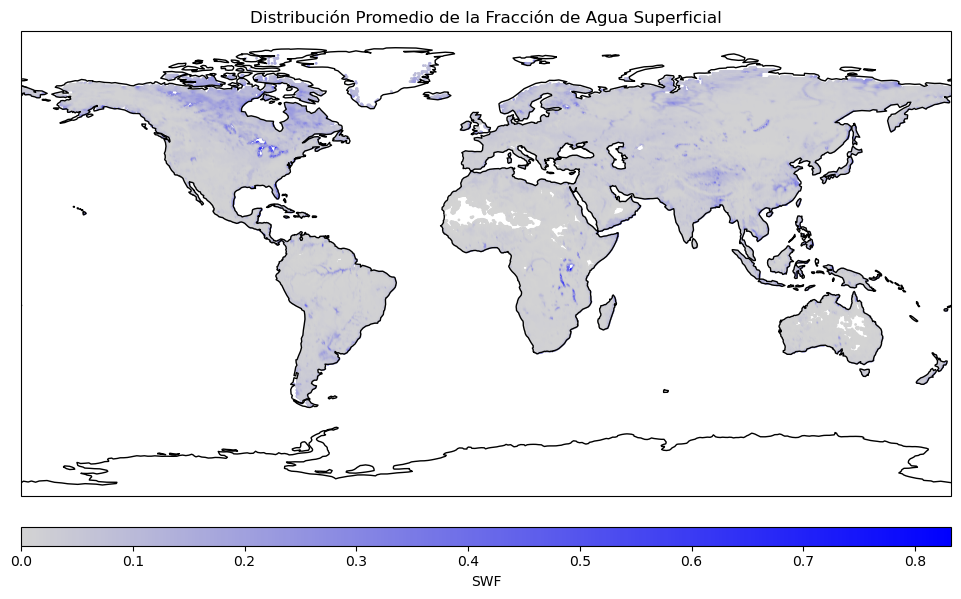

In [13]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import cartopy.crs as ccrs

df_promedio_A = promedio_por_dia(df_A, 'fwns')

gdf = gpd.GeoDataFrame(
    df_promedio_A.reset_index(),
    geometry=gpd.points_from_xy(df_promedio_A.reset_index()['lon_var'], df_promedio_A.reset_index()['lat_var'])
)

fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={"projection": ccrs.PlateCarree()})
ax.coastlines()
ax.set_global()

colors = ["#d3d3d3", "blue"]
cmap_ = LinearSegmentedColormap.from_list("LightGrayToBlue", colors)

collection = ax.scatter(
    gdf.geometry.x,
    gdf.geometry.y,
    c=gdf['fwns'],
    cmap=cmap_,
    s=1,
    transform=ccrs.PlateCarree()
)

cbar = plt.colorbar(collection, ax=ax, orientation='horizontal', pad=0.05, aspect=50)
cbar.set_label('SWF')

plt.title('Distribución Promedio de la Fracción de Agua Superficial')
plt.show()


En estas dos figuras podemos ver aquellas zonas donde la fwns es mayor que 0 y por tanto, donde hay agua. En la figura de los datos ascendentes, se puede visualizar mejor las zonas de los Grandes Lagos de EEUU y los lagos más improtantes de África: Lago Victoria, Lago Tanganica, Lago Malagui, Lago Turkana, Lago Alberto, Lago Eduard, Lago Kivu. Además también podemos ver destacados algunos de los rios más importanes del mundo: Amazonas, Obi, Lena, etc. 

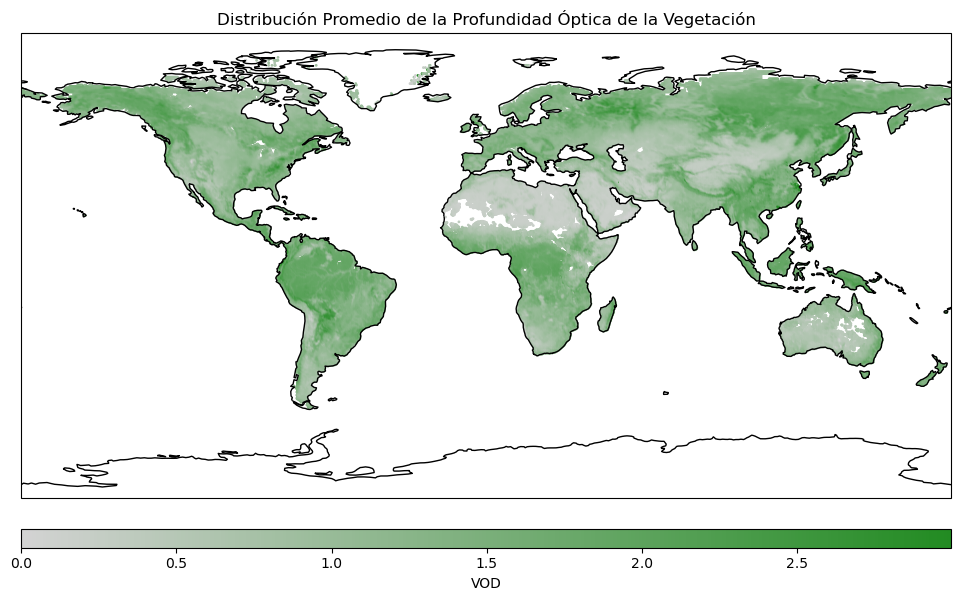

In [14]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import cartopy.crs as ccrs

df_promedio_VOD = promedio_por_dia(df_A, 'VOD')

gdf = gpd.GeoDataFrame(
    df_promedio_VOD.reset_index(),
    geometry=gpd.points_from_xy(df_promedio_VOD.reset_index()['lon_var'], df_promedio_VOD.reset_index()['lat_var'])
)

fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={"projection": ccrs.PlateCarree()})
ax.coastlines()
ax.set_global()

colors = ["#d3d3d3", "#228B22"]
cmap_ = LinearSegmentedColormap.from_list("GrayToGreen", colors)

collection = ax.scatter(
    gdf.geometry.x,
    gdf.geometry.y,
    c=gdf['VOD'],
    cmap=cmap_,
    s=1,
    transform=ccrs.PlateCarree()
)

cbar = plt.colorbar(collection, ax=ax, orientation='horizontal', pad=0.05, aspect=50)
cbar.set_label('VOD')

plt.title('Distribución Promedio de la Profundidad Óptica de la Vegetación')
plt.show()


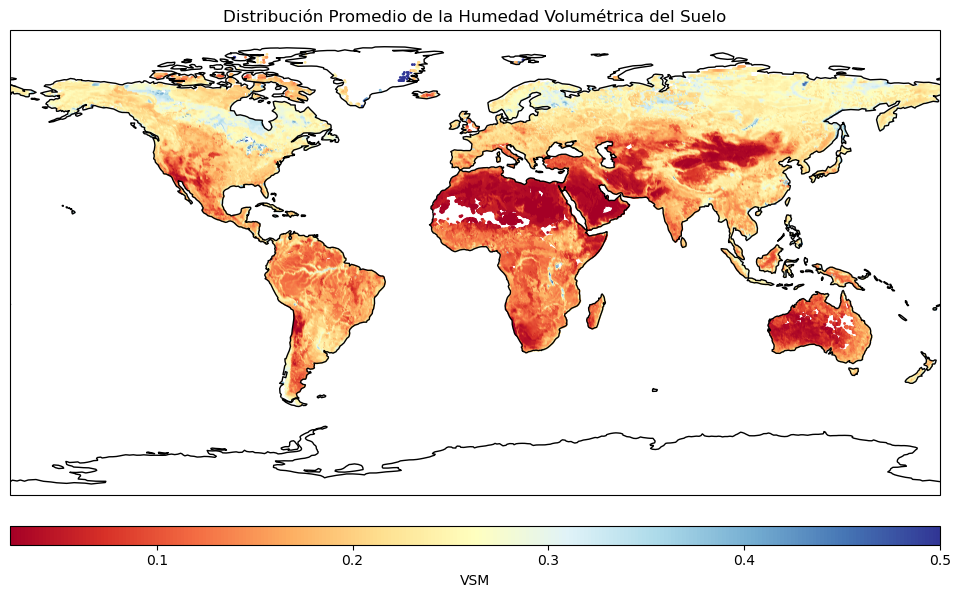

In [15]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import cartopy.crs as ccrs

df_promedio_vsm = promedio_por_dia(df_A, 'vsm')

gdf = gpd.GeoDataFrame(
    df_promedio_vsm.reset_index(),
    geometry=gpd.points_from_xy(
        df_promedio_vsm.reset_index()['lon_var'],
        df_promedio_vsm.reset_index()['lat_var']
    )
)

fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={"projection": ccrs.PlateCarree()})
ax.coastlines()
ax.set_global()

cmap_ = plt.get_cmap('RdYlBu')

collection = ax.scatter(
    gdf.geometry.x,
    gdf.geometry.y,
    c=gdf['vsm'],
    cmap=cmap_,
    s=1,
    transform=ccrs.PlateCarree()
)

cbar = plt.colorbar(collection, ax=ax, orientation='horizontal', pad=0.05, aspect=50)
cbar.set_label('VSM')

plt.title('Distribución Promedio de la Humedad Volumétrica del Suelo')
plt.show()


Vamos a hacer una gráfica interactiva para poder visualizar más en profundidad estás zonas mencionadas anteriormente. 

In [16]:
import plotly.express as px
import pandas as pd
import geopandas as gpd

df_A = df_A.dropna(subset=['lat_var', 'lon_var', 'fwns'])

df_A['fwns'] = pd.to_numeric(df_A['fwns'], errors='coerce')

df_plot = df_A[['lat_var', 'lon_var', 'fwns']].sample(n=100000)  # .sample(n=500000) Ajusta el número de puntos según lo necesario


#gráfico interactivo
fig = px.scatter_geo(df_plot,
                     lat='lat_var',
                     lon='lon_var',
                     color='fwns',  # color de los puntos según 'fwns'
                     color_continuous_scale="Viridis",
                     projection="natural earth",  # Proyección global
                     title="Distribución de la Fracción de Agua (Interactividad Activada)",
                     labels={'fwns': 'Fracción de Agua'},
                     # template="plotly_dark",# Cambiar el fondo a negro
                     template="plotly", # Cambiar el fondo a blanco
                     width=900,
                     height=600)

fig.update_traces(marker=dict(size=1))

fig.update_geos(showcoastlines=True, coastlinecolor="black", showland=True, landcolor="white")
fig.update_layout(
    geo=dict(
        projection_type="natural earth", 
        showland=True,
        landcolor="white" 
    ),
    margin={"r":0,"t":40,"l":0,"b":0},  
    title_font_size=18,
)

fig.show()

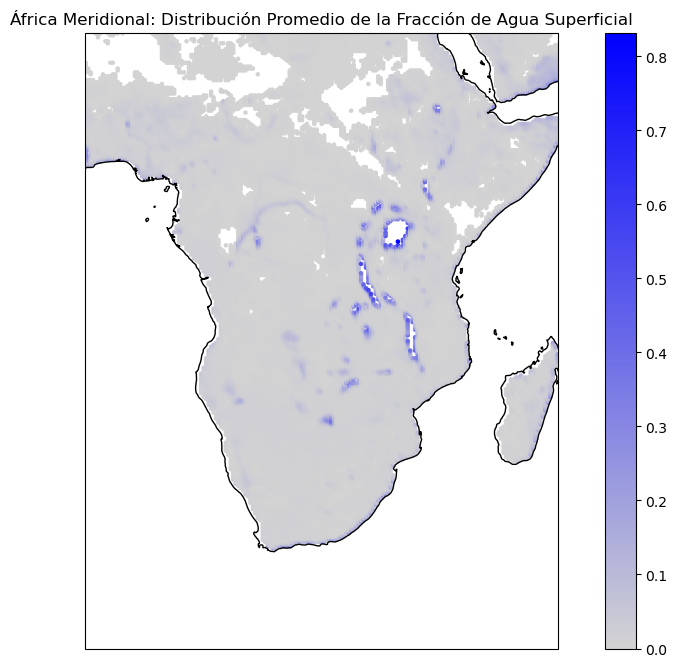

In [17]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs


df_promedio_fwns = promedio_por_dia(df_A, 'fwns')


gdf = gpd.GeoDataFrame(
    df_promedio_fwns.reset_index(),
    geometry=gpd.points_from_xy(df_promedio_fwns.reset_index()['lon_var'], df_promedio_fwns.reset_index()['lat_var'])
)

fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={"projection": ccrs.PlateCarree()})
ax.coastlines()
ax.set_extent([0, 50, -45, 20], crs=ccrs.PlateCarree())

# Create custom colormap    
colors = ["#d3d3d3", "blue"]  # Gris claro en lugar de gris oscuro
cmap_ = LinearSegmentedColormap.from_list("LightGrayToBlue", colors)

gdf.plot(column='fwns', cmap=cmap_, legend=True, ax=ax, markersize=5, transform=ccrs.PlateCarree())

plt.title('África Meridional: Distribución Promedio de la Fracción de Agua Superficial')

plt.show()

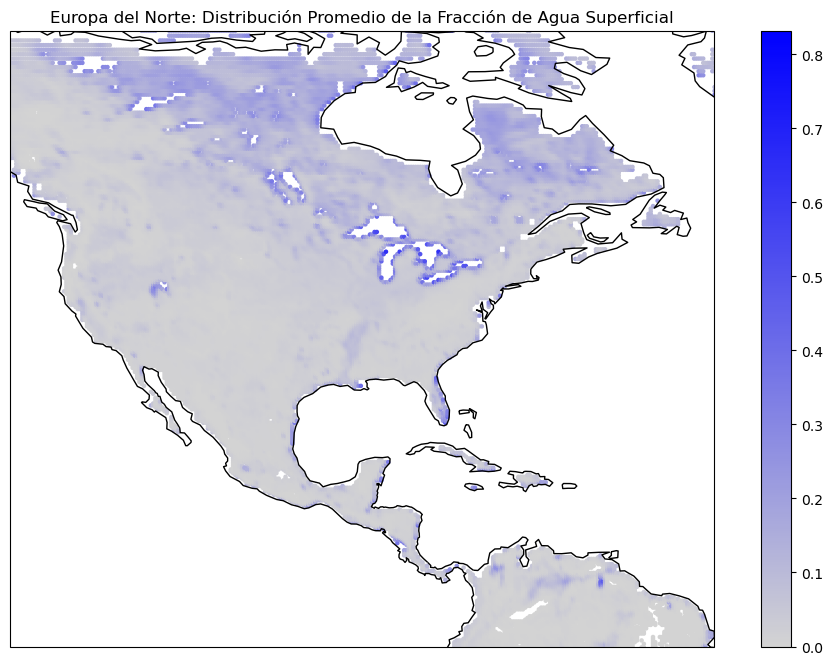

In [18]:
# import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

gdf = gpd.GeoDataFrame(
    df_promedio_fwns.reset_index(),
    geometry=gpd.points_from_xy(df_promedio_fwns.reset_index()['lon_var'], df_promedio_fwns.reset_index()['lat_var'])
)

fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={"projection": ccrs.PlateCarree()})
ax.coastlines()
ax.set_extent([-130, -50, 0, 70], crs=ccrs.PlateCarree())

# Create custom colormap    
colors = ["#d3d3d3", "blue"]  # Gris claro en lugar de gris oscuro
cmap_ = LinearSegmentedColormap.from_list("LightGrayToBlue", colors)

gdf.plot(column='fwns', cmap=cmap_, legend=True, ax=ax, markersize=5, transform=ccrs.PlateCarree())

plt.title('Europa del Norte: Distribución Promedio de la Fracción de Agua Superficial')

plt.show()

### Distribución de datos geográficos en función de la densidad

In [19]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

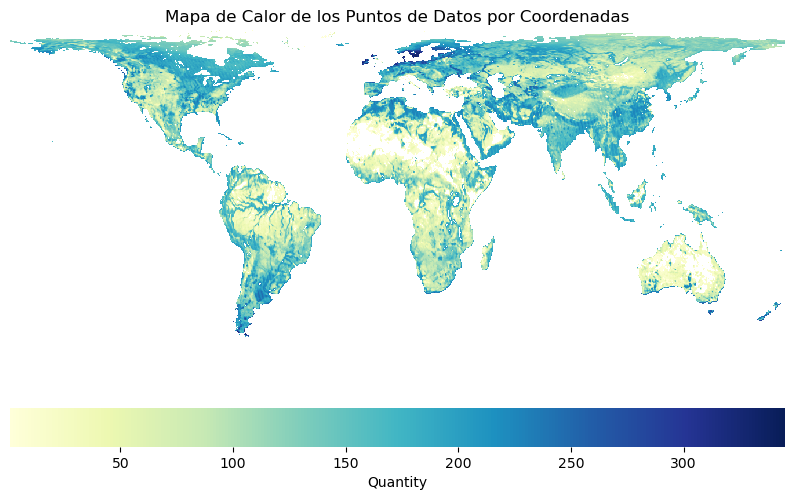

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Agrupar y pivotear los datos
coord_counts = df_A.groupby(['lon_var', 'lat_var']).size().reset_index(name='count')
pivot = coord_counts.pivot(index='lat_var', columns='lon_var', values='count')

plt.figure(figsize=(10, 7))

ax = sns.heatmap(
    pivot,
    cmap='YlGnBu',
    cbar=True,
    cbar_kws={'orientation': 'horizontal', 'label': 'Quantity'},
    square=True
)

ax.invert_yaxis()

plt.title('Mapa de Calor de los Puntos de Datos por Coordenadas')

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])

plt.subplots_adjust(bottom=0.2)

plt.show()


Esta imagen es un mapa de calor geoespacial que muestra la distribución de puntos de datos en función de coordenadas de latitud y longitud. 

Hay una mayor densidad de datos en regiones de América del Norte, Europa y Asia, especialmente en el hemisferio norte.
Algunas regiones, como el desierto del Sahara y la Antártida, tienen poca o ninguna representación.
Se observa una mayor concentración en áreas pobladas y con actividad climática significativa.

### Distribución de datos geográficos en función de la variable Date

In [21]:
'''
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import imageio
import os
import numpy as np

output_dir = 'output_images_A'
os.makedirs(output_dir, exist_ok=True)

for DoY in range(1, 366):  # Loop para cada día del año

    DoY_str = str(DoY).zfill(3)
    df_filtered = df_A[df_A['Date'] == DoY]

    gdf = gpd.GeoDataFrame(
        df_filtered.reset_index(),
        geometry=gpd.points_from_xy(df_filtered['lon_var'], df_filtered['lat_var'])
    )

    fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={"projection": ccrs.PlateCarree()})
    ax.coastlines()
    ax.set_global()

    gdf.plot(
        column='fwns',  # Usar la columna 'fwns' para el color
        cmap='coolwarm',  # Colormap fijo
        legend=True,  # Mostrar leyenda
        ax=ax,  # Eje de la gráfica
        markersize=5,  # Tamaño de los puntos ajustado para que sean visibles
        transform=ccrs.PlateCarree(),  # Proyección correcta
        vmin=0,  # Establecer límite mínimo de color (0)
        vmax=1,  # Establecer límite máximo de color (1)
        legend_kwds={'label': "Fracción de Agua (fwns)", 'orientation': "horizontal"}
    )

    ax.set_title(f'Distribución de la Fracción de Agua (fwns) - Día {DoY_str}')

    image_path = os.path.join(output_dir, f'day_{DoY_str}.png')
    plt.savefig(image_path)
    plt.close()
'''

'\nimport geopandas as gpd\nimport matplotlib.pyplot as plt\nimport cartopy.crs as ccrs\nimport imageio\nimport os\nimport numpy as np\n\noutput_dir = \'output_images_A\'\nos.makedirs(output_dir, exist_ok=True)\n\nfor DoY in range(1, 366):  # Loop para cada día del año\n\n    DoY_str = str(DoY).zfill(3)\n    df_filtered = df_A[df_A[\'Date\'] == DoY]\n\n    gdf = gpd.GeoDataFrame(\n        df_filtered.reset_index(),\n        geometry=gpd.points_from_xy(df_filtered[\'lon_var\'], df_filtered[\'lat_var\'])\n    )\n\n    fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={"projection": ccrs.PlateCarree()})\n    ax.coastlines()\n    ax.set_global()\n\n    gdf.plot(\n        column=\'fwns\',  # Usar la columna \'fwns\' para el color\n        cmap=\'coolwarm\',  # Colormap fijo\n        legend=True,  # Mostrar leyenda\n        ax=ax,  # Eje de la gráfica\n        markersize=5,  # Tamaño de los puntos ajustado para que sean visibles\n        transform=ccrs.PlateCarree(),  # Proyección correcta\

In [22]:
'''
import cv2
import os

input_folder = 'output_images_D'
output_video_path = 'output_video_D.mp4'

images = [img for img in os.listdir(input_folder) if img.endswith(".png")]
images.sort()  

first_image_path = os.path.join(input_folder, images[0])
first_image = cv2.imread(first_image_path)

height, width, layers = first_image.shape

fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec para video mp4
fps = 5  # Puedes ajustar los frames por segundo

out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

for image_name in images:
    image_path = os.path.join(input_folder, image_name)
    image = cv2.imread(image_path)
    out.write(image)  # Escribir la imagen en el video

out.release() # Liberar el objeto VideoWriter y finalizar

print(f"Video generado y guardado en: {output_video_path}")
'''

'\nimport cv2\nimport os\n\ninput_folder = \'output_images_D\'\noutput_video_path = \'output_video_D.mp4\'\n\nimages = [img for img in os.listdir(input_folder) if img.endswith(".png")]\nimages.sort()  \n\nfirst_image_path = os.path.join(input_folder, images[0])\nfirst_image = cv2.imread(first_image_path)\n\nheight, width, layers = first_image.shape\n\nfourcc = cv2.VideoWriter_fourcc(*\'mp4v\')  # Codec para video mp4\nfps = 5  # Puedes ajustar los frames por segundo\n\nout = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))\n\nfor image_name in images:\n    image_path = os.path.join(input_folder, image_name)\n    image = cv2.imread(image_path)\n    out.write(image)  # Escribir la imagen en el video\n\nout.release() # Liberar el objeto VideoWriter y finalizar\n\nprint(f"Video generado y guardado en: {output_video_path}")\n'

### Matriz de correlación

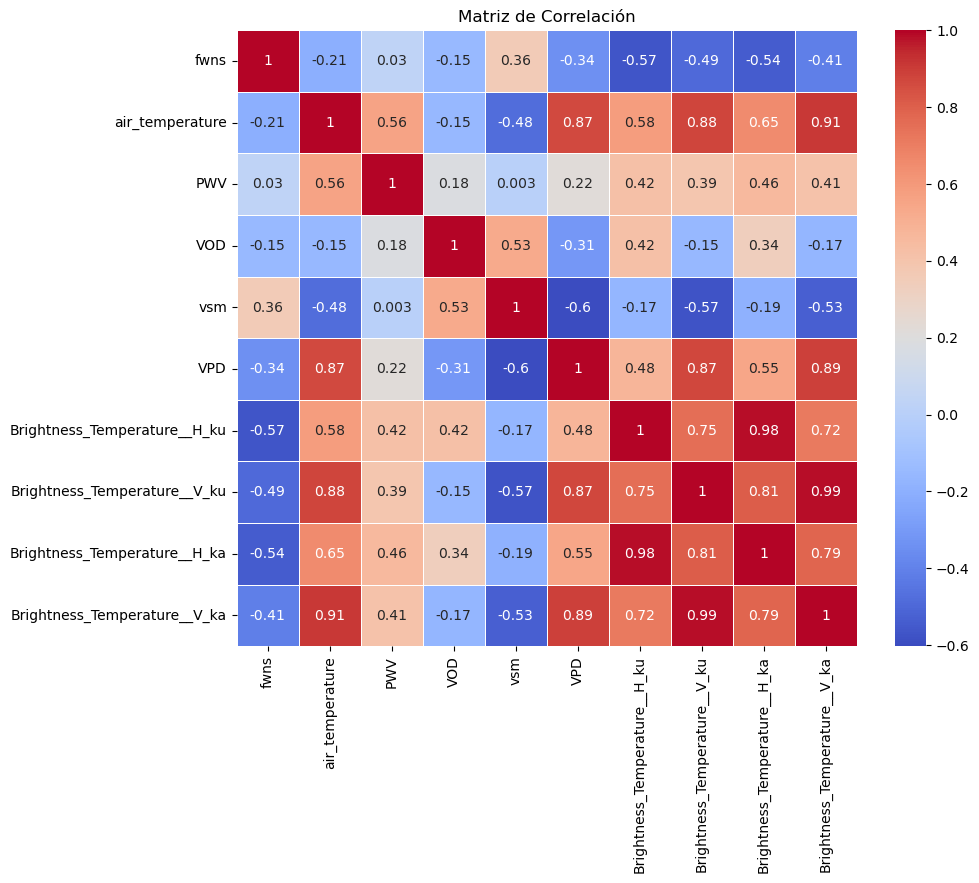

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

df_correlation_A = df_A.drop(columns=['fw', 'lat_var', 'lon_var', 'Time_Information', 'Date'])

correlation_matrix = df_correlation_A.corr()

plt.figure(figsize=(10, 8))  # Tamaño de la figura
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Matriz de Correlación')
plt.show()

Valores destacados:

fw y fwns tienen una correlación casi perfecta (0.93), lo que indica que están fuertemente relacionadas. Lo cual tiene sentido porque son la misma variable con y sin suavizado

Brightness_Temperature__H_ku y Brightness_Temperature__V_ku tienen una correlación cercana a 1 (0.98), lo que sugiere que miden aspectos muy similares.

VPD y air_temperature tienen una correlación alta (0.87), lo que indica que cuando la temperatura del aire aumenta, el déficit de presión de vapor también lo hace.

VPD y vsm tienen una correlación negativa fuerte (-0.6), lo que sugiere que cuando aumenta el déficit de presión de vapor, la humedad del suelo disminuye.

### Regresión lineal

In [24]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Ajuste del modelo de regresión lineal
formula = 'fwns ~ ' + ' + '.join(df_A.columns.difference(['fwns','lon_var', 'lat_var', 'Time_Information', 'fw', 'Date', 'PWV', 'VOD', 'VPD', 'air_temperature', 'vsm']))
model = smf.ols(formula, data=df_A)
ajuste = model.fit()
ajuste.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   fwns   R-squared:                       0.486
Model:                            OLS   Adj. R-squared:                  0.486
Method:                 Least Squares   F-statistic:                 5.239e+06
Date:                Fri, 25 Jul 2025   Prob (F-statistic):               0.00
Time:                        11:23:28   Log-Likelihood:             4.2457e+07
No. Observations:            22173686   AIC:                        -8.491e+07
Df Residuals:                22173681   BIC:                        -8.491e+07
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept                        0.4237      0.000   1904.194      0.000       0.423       0.424
Brightness_Temperature__H_ka    -0.0034   5.47e-06   -614.676      0.000      -0.003      -0.003
Brightness_Temperature__H_ku     0.0016   4.29e-06    371.103      0.000       0.002       0.002
Brightness_Temperature__V_ka     0.0142   6.37e-06   2225.788      0.000       0.014       0.014
Brightness_Temperature__V_ku    -0.0138   5.66e-06  -2437.876      0.000      -0.014      -0.014
==============================================================================
Omnibus:                 14574672.040   Durbin-Watson:                   0.598
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        298191187.038
Skew:                           2.868   Prob(JB):                         0.00
Kurtosis:                      20.025   Cond. No.                     1.62e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.62e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [25]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Ajuste del modelo de regresión lineal
formula = 'fwns ~ ' + ' + '.join(df_A.columns.difference(['fwns','lon_var', 'lat_var', 'Time_Information', 'fw', 'Date']))
model = smf.ols(formula, data=df_A)
ajuste = model.fit()
ajuste.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   fwns   R-squared:                       0.620
Model:                            OLS   Adj. R-squared:                  0.620
Method:                 Least Squares   F-statistic:                 4.022e+06
Date:                Fri, 25 Jul 2025   Prob (F-statistic):               0.00
Time:                        11:24:49   Log-Likelihood:             4.5812e+07
No. Observations:            22173686   AIC:                        -9.162e+07
Df Residuals:                22173676   BIC:                        -9.162e+07
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept                       -0.3199      0.001   -480.633      0.000      -0.321      -0.319
Brightness_Temperature__H_ka    -0.0053   5.39e-06   -990.740      0.000      -0.005      -0.005
Brightness_Temperature__H_ku     0.0036    4.6e-06    787.679      0.000       0.004       0.004
Brightness_Temperature__V_ka     0.0114    7.1e-06   1610.280      0.000       0.011       0.011
Brightness_Temperature__V_ku    -0.0125   6.35e-06  -1960.587      0.000      -0.012      -0.012
PWV                              0.0002   9.18e-07    195.210      0.000       0.000       0.000
VOD                             -0.0311   2.65e-05  -1172.921      0.000      -0.031      -0.031
VPD                             -0.0195   1.72e-05  -1133.454      0.000      -0.020      -0.020
air_temperature                  0.0040   2.51e-06   1582.169      0.000       0.004       0.004
vsm                              0.1201      0.000    926.413      0.000       0.120       0.120
==============================================================================
Omnibus:                 12259683.021   Durbin-Watson:                   0.638
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        243917610.479
Skew:                           2.246   Prob(JB):                         0.00
Kurtosis:                      18.615   Cond. No.                     6.40e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.4e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

R-cuadrado: 0.621 - Esto significa que aproximadamente el 62.1% de la variabilidad en la variable dependiente (fwns) puede ser explicada por las variables independientes en el modelo.

R-cuadrado ajustado: 0.621 - Esto también indica que el modelo tiene un buen ajuste, considerando el número de predictores.

Estadístico F: 3.632e+06 - Este es un valor alto, lo que sugiere que el modelo es estadísticamente significativo.

Probabilidad (estadístico F): 0.00 - Este valor indica que el modelo es altamente significativo.

AIC/BIC (Criterios de Información Akaike y Bayesiano): Ambos son negativos, lo cual es típico cuando se comparan modelos; valores más bajos suelen indicar un mejor ajuste del modelo.

Intercepto (Constante): -0.3355 - Representa el valor de la variable dependiente cuando todas las variables independientes son cero. Es estadísticamente significativo (con un valor t de -501.617).

---------------------------------------------------------------------------------------------------------

Significado de las Variables Individuales:

Temperatura de Brillo (H_ka, H_ku, V_ka, V_ku): Estos coeficientes representan el efecto de diferentes temperaturas de brillo sobre la variable dependiente, con efectos significativos al nivel del 1% (indicado por p-valores muy pequeños).

H_ka y V_ku tienen coeficientes negativos, mientras que H_ku y V_ka tienen coeficientes positivos.
Fecha: El coeficiente (1.536e-05) muestra una relación muy pequeña pero positiva con la variable dependiente.

PWV (Agua Precipitable en Vapor): Tiene un coeficiente positivo muy pequeño (0.0002), lo que sugiere un impacto positivo muy leve.
VOD (Profundidad Óptica de Vegetación): Tiene un impacto negativo significativo con un coeficiente de -0.0314.

VPD (Déficit de Presión de Vapor): También tiene un coeficiente negativo (-0.0198), lo que indica una relación negativa.
Temperatura del aire: El coeficiente positivo (0.004) indica un efecto positivo sobre la variable dependiente.

VSM (Humedad del Suelo en Vegetación): Este tiene el coeficiente más grande (0.1206), lo que indica que tiene un gran impacto positivo sobre la variable dependiente, y es significativo con un valor t muy alto de 931.201.


In [26]:
import statsmodels.api as sm
import pandas as pd

X = df_A[['Brightness_Temperature__H_ka', 'Brightness_Temperature__H_ku', 
          'Brightness_Temperature__V_ka', 'Brightness_Temperature__V_ku',
          'PWV', 'VOD', 'VPD', 'air_temperature', 'vsm']]
y = df_A['fw']

model = sm.OLS(y, sm.add_constant(X)).fit()

p_values = model.pvalues
p_values

const                           0.000000e+00
Brightness_Temperature__H_ka    6.313238e-14
Brightness_Temperature__H_ku    0.000000e+00
Brightness_Temperature__V_ka    0.000000e+00
Brightness_Temperature__V_ku    0.000000e+00
PWV                             0.000000e+00
VOD                             0.000000e+00
VPD                             0.000000e+00
air_temperature                 0.000000e+00
vsm                             0.000000e+00
dtype: float64